<div>
<img src="image/images.png" width="100%"/>
</div>

<h1><center>DATA ACCESS TEMPLATE FOR <br> H64 DATA PRODUCTS</center></h1>

[Template](../notebooks)

## Pre-requisite and data sources

Before diving into the exploration of H64 data products, it's essential to ensure that you have the necessary prerequisites in place. This section outlines the requirements and data sources needed for working with H64 data effectively.

### Pre-Requisites
- Python Environment: Ensure that you have a Python environment set up on your system. You can use Python 3.x along with essential libraries for scientific computing, data analysis, and visualization.

- Jupyter Notebook: Install Jupyter Notebook, which provides an interactive environment for running Python code, visualizing data, and documenting your analysis workflows. You can install Jupyter Notebook using Python package managers like pip or conda.

- H64 Data Access Library: Obtain the H64 data access library, which facilitates the retrieval, processing, and analysis of H64 data products. You can install the library using pip or conda, or by downloading the source code from the official repository.

- User Credentials: Obtain valid credentials (username and password) for accessing the H-SAF (Hydrology SAF) data server. These credentials are required for downloading H64 data products from the server. If you don't have credentials yet, you can register on the H-SAF website to obtain them.

### Data Sources
The primary data source for this analysis is the H64 data product provided by the H-SAF initiative. H64 is a satellite-based precipitation dataset that offers high-resolution rainfall estimates for various applications in hydrology, meteorology, and environmental studies.

A non-registered user needs to follow the link below to create an account.

   
   
Obtaining User Credentials
To access the H-SAF data server and download H64 data products, you need valid credentials (username and password). These credentials can be obtained from the official H-SAF website by registering for an account. If you don't have credentials yet, you can create an account on the H-SAF website at this [Link](https://hsaf.meteoam.it/ "Follow this link if you don't have an H-SAF account").

#### Recommended Reading
Before proceeding further, it's recommended to familiarize yourself with the following resources:

- H64 Product Manual: Refer to the official product manual for H64 data products to understand the data format, variables, processing algorithms, and quality control procedures. The product manual serves as a comprehensive guide for interpreting and analyzing H64 datasets.

- H-SAF Website Documentation: Explore the documentation available on the H-SAF website, which provides detailed information about the H-SAF project, data products, data access methods, and usage guidelines. The documentation offers valuable insights into the H-SAF data ecosystem and best practices for working with H64 data.

By ensuring that you have the necessary prerequisites and understanding the data sources, you'll be well-equipped to explore and analyze H64 data products effectively in the subsequent sections.

## Table of Contents

Define the table of contents and update whenever new content is added to the page.


- [Introduction](#Introduction)

- [Objectives](#Objectives)

- [Library imports](#Library-imports)

- [Access and authentication](#Data-access-and-authentication)

- [Data download](#Data-download)

- [Data processing](#Data-reading-and-pre\-processing-such-as-filter\,-area-definition-and-data-sampling)

- [Results visualisation](#Results-Visualization)

- [Data analysis](#Data-Analysis/Evaluation)

- [Save](#Save)

- [Conclusion](#Conclusion)

- [Reference](#References)

## Introduction

Welcome to the data exploration notebook for H64 data products! In this notebook, we will delve into the fascinating world of H64, a satellite-based precipitation dataset provided by the H-SAF (Hydrology SAF) initiative. H64 offers high-resolution rainfall estimates, making it a valuable resource for various applications in hydrology, meteorology, and environmental studies.

The H-SAF project aims to deliver reliable and timely satellite-derived products to support research, monitoring and decision-making in hydrological and meteorological domains. H64, specifically, provides detailed precipitation data that can be used to analyze rainfall patterns, assess hydrological processes, and monitor environmental changes.

This notebook serves as a comprehensive guide for exploring H64 data, covering data access, processing, visualization, and analysis techniques. Whether you're a researcher, scientist, or enthusiast interested in rainfall data, this notebook provides valuable insights and tools for working with H64 datasets effectively.

Now, let's embark on a journey to uncover the secrets hidden within H64 precipitation data!



## Objectives
The objective of this notebook is to provide a comprehensive template for accessing, processing, and visualizing H64 data products for a specified region.  
By following this guide, one will gain insight on how to effectively work with H64 data products for research and analysis.

## Library imports

In this section, we import the necessary Python libraries and modules required for data access, processing, analysis, and visualization. The libraries are imported in a structured manner as follows.  
- Standard library
- Related third party imports
- Local application of library specific imports

In [1]:
import os
from datetime import datetime, date

import numpy as np
import matplotlib.pyplot as plt
import netCDF4 as nc
import cartopy as cart
import ipywidgets as widgets
import math
import pandas as pd
import xarray as xr
import geopandas as gpd
from IPython.display import display, IFrame
from shapely.geometry import Polygon
from scipy.stats import skew
import matplotlib.dates as mdates

from hsaf_data_access import HSAFDataAccess as data_access

## Data access and authentication
In this instance, the user credentials (username and password) needed for accessing the FTP server will be required. Thus, the user has to be pre-informed on the need to provide their own credentials (or ad-hoc login info created for training purposes) in order for the required data to be downloaded from the server. 

The below code segment sets up the necessary folders, defines date selection widgets for specifying the start and end dates, and provides widgets for user authentication, including username and password.

Ensure that the folder creation process and widget initialization are properly executed before proceeding with data download and processing. These steps are crucial for organizing data and ensuring user interaction for authentication and date selection.

In [2]:
# Set up necessary folders
data_access.create_folders()

# Define working directory
work_dir = os.getcwd()
os.chdir(work_dir)
data_path = work_dir + '/data/'

# Date selection widgets
datestart = widgets.DatePicker(description='Start Date', disabled=False, value=date.today(), max=date.today())
dateend = widgets.DatePicker(description='End Date', disabled=False, value=date.today(), max=date.today())
display(widgets.HBox([datestart, dateend]))

# User authentication widgets
username = widgets.Text(description='Username:', disabled=False)
psw = widgets.Password(description='Password:', disabled=False)
display(widgets.HBox([username, psw]))

## Data download

In this section, we download the H64 data product using the `download_h64()` method from the `HSAFDataAccess` library. We utilize the user-supplied credentials (username and password) and the specified date range for downloading the data.
The `download_h64()` method downloads the H64 data product for the specified date range. If data is not available for any day within the specified range, a feedback message is printed to inform the user.

Ensure that the username, password, and date range have been properly supplied by the user before executing this code segment.

In [3]:
try:
    data_access.download_h64(username.value, psw.value, datestart.value, dateend.value, data_path, 'h64')
except Exception as e:
    print(f'Error downloading data: {str(e)}')

Info: Preparing data download...
Info: h64_20240901_0000_24_hea.nc.gz downloaded
Info: h64_20240902_0000_24_hea.nc.gz downloaded
Info: h64_20240903_0000_24_hea.nc.gz downloaded
Info: h64_20240904_0000_24_hea.nc.gz downloaded
Info: h64_20240905_0000_24_hea.nc.gz downloaded
Info: h64_20240906_0000_24_hea.nc.gz downloaded
Info: h64_20240907_0000_24_hea.nc.gz downloaded
Info: h64_20240908_0000_24_hea.nc.gz downloaded
Info: h64_20240909_0000_24_hea.nc.gz downloaded
Info: h64_20240910_0000_24_hea.nc.gz downloaded
Info: h64_20240911_0000_24_hea.nc.gz downloaded
Info: h64_20240912_0000_24_hea.nc.gz downloaded
Info: h64_20240913_0000_24_hea.nc.gz downloaded
Info: h64_20240914_0000_24_hea.nc.gz downloaded
Info: h64_20240915_0000_24_hea.nc.gz downloaded
Info: h64_20240916_0000_24_hea.nc.gz downloaded
Info: h64_20240917_0000_24_hea.nc.gz downloaded
Info: h64_20240918_0000_24_hea.nc.gz downloaded
Info: h64_20240919_0000_24_hea.nc.gz downloaded
Info: h64_20240920_0000_24_hea.nc.gz downloaded
Info: h

## Data reading and pre-processing
This section demonstrates how to define the study area and preprocess the downloaded data, ensuring it's ready for further analysis.

#### Area definition

The area of study could be defined by specifying the coordinates of a bounding box containing the study area or by using a shapefile of the area of interest.

##### Bounding Box  
To define the study area using a bounding box, provide the coordinates in a numpy array in the order of
* lower left
* lower right
* upper right
* upper left

##### Shapefile
To use a shapefile for defining the study area, upload the shapefile using the widget below.

`Note:` Ensure that the shapefile uploaded is in the correct format and contains the necessary spatial information for defining the study area.

In [4]:
aoi_shp = data_access.create_shp_widgets()
aoi_box = data_access.create_box_widgets()
aoi_tab = widgets.Tab()
tab_contents = ['Area by Bounding Box', 'Area by Shapefile']
children = [aoi_box, aoi_shp]
aoi_tab.children = children
for i in range(len(tab_contents)):
    aoi_tab.set_title(i, tab_contents[i])
aoi_tab

In [5]:
# Get the value of the AOI object
if aoi_tab.selected_index==0:
    bb_coord = []
    aoi = (aoi_tab.children[0].children[1:])
    for child in aoi:
        bb_coord.append(child.value)
    x = np.array([bb_coord[0], bb_coord[1], bb_coord[1], bb_coord[0]])
    y = np.array([bb_coord[2], bb_coord[2], bb_coord[3], bb_coord[3]])
    polygon = Polygon(zip(x, y))
    aoi_gdf = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])
    aoi_gdf = aoi_gdf.to_crs("EPSG:4326")
elif aoi_tab.selected_index==1:
    shp_path = (aoi_tab.children[1].children[0].value)
        
    # Read the shapefile to start the spatial analysis
    aoi_gdf = gpd.read_file(shp_path)

    # Reproject the shapefile to the CRS of data
    aoi_gdf = aoi_gdf.to_crs("EPSG:4326")

#### Data unwrapping

The downloaded data are in a gzipped format and need to be extracted and cleaned using the extract_and_clean_data method. After extraction, empty files are removed from the directory.

In [6]:
# Extract and clean the downloaded data
data_access.extract_and_clean_data(data_path)

The code snippet below retrieves the list of files in the `storedir` directory, sorts them alphabetically, and then determine the number of rows and columns needed for plotting in a square grid layout.

In [7]:
# list the files in the data path and sort them
filelist = os.listdir(data_path)
filelist.sort()

# Check if the filelist is empty or None
if not filelist:
    raise ValueError("No files found in the directory: {}".format(data_path))
    
# Get the number of files in the data file and get the ceil of the sqrt to determine the subplot dimensions
plt_dim = math.ceil(
                math.sqrt(
                    len(filelist)
                )
            )

The code below extracts dates from the file names in the `filelist` variable and ensures that the datestart variable contains the earliest date and the dateend variable contains the latest date available in the file names, allowing for dynamic handling of date ranges based on the available data files.

In [8]:
# Extract dates from file names
dates = [datetime(int(file[4:8]), int(file[8:10]), int(file[10:12])) for file in filelist]

# Redefine the initial and ending date based only on the days data is available
datestart = min(dates)
dateend = max(dates)

#### Data Reading and plotting

In this section, the extracted data in NetCDF format are read and processed for visualization. The process involves preparing the axes for plotting, reading and processing the data, and then plotting the data on the axes.

- The number of subplots is determined based on the number of files available in the directory, ensuring that each file is represented in the visualization.
- A loop iterates over each file, reading its content and extracting relevant data for plotting.
- The extracted data are then plotted on individual axes, with each subplot representing a specific date.
- The title of each subplot reflects the corresponding date of the data being plotted.
- Additionally, a color bar is included to indicate the color scale for rainfall values.
- Finally, borders are added to each subplot to demarcate the study area region visually.

The code dynamically adapts to the number of files available, ensuring that all available data are visualized appropriately. This section provides a comprehensive overview of the rainfall events over time, facilitating further analysis and interpretation of the H64 data product.

Reading file h64_20240901_0000_24_hea.nc
Done reading file h64_20240901_0000_24_hea.nc
Reading file h64_20240902_0000_24_hea.nc
Done reading file h64_20240902_0000_24_hea.nc
Reading file h64_20240903_0000_24_hea.nc
Done reading file h64_20240903_0000_24_hea.nc
Reading file h64_20240904_0000_24_hea.nc
Done reading file h64_20240904_0000_24_hea.nc
Reading file h64_20240905_0000_24_hea.nc
Done reading file h64_20240905_0000_24_hea.nc
Reading file h64_20240906_0000_24_hea.nc
Done reading file h64_20240906_0000_24_hea.nc
Reading file h64_20240907_0000_24_hea.nc
Done reading file h64_20240907_0000_24_hea.nc
Reading file h64_20240908_0000_24_hea.nc
Done reading file h64_20240908_0000_24_hea.nc
Reading file h64_20240909_0000_24_hea.nc
Done reading file h64_20240909_0000_24_hea.nc
Reading file h64_20240910_0000_24_hea.nc
Done reading file h64_20240910_0000_24_hea.nc
Reading file h64_20240911_0000_24_hea.nc
Done reading file h64_20240911_0000_24_hea.nc
Reading file h64_20240912_0000_24_hea.nc
Do

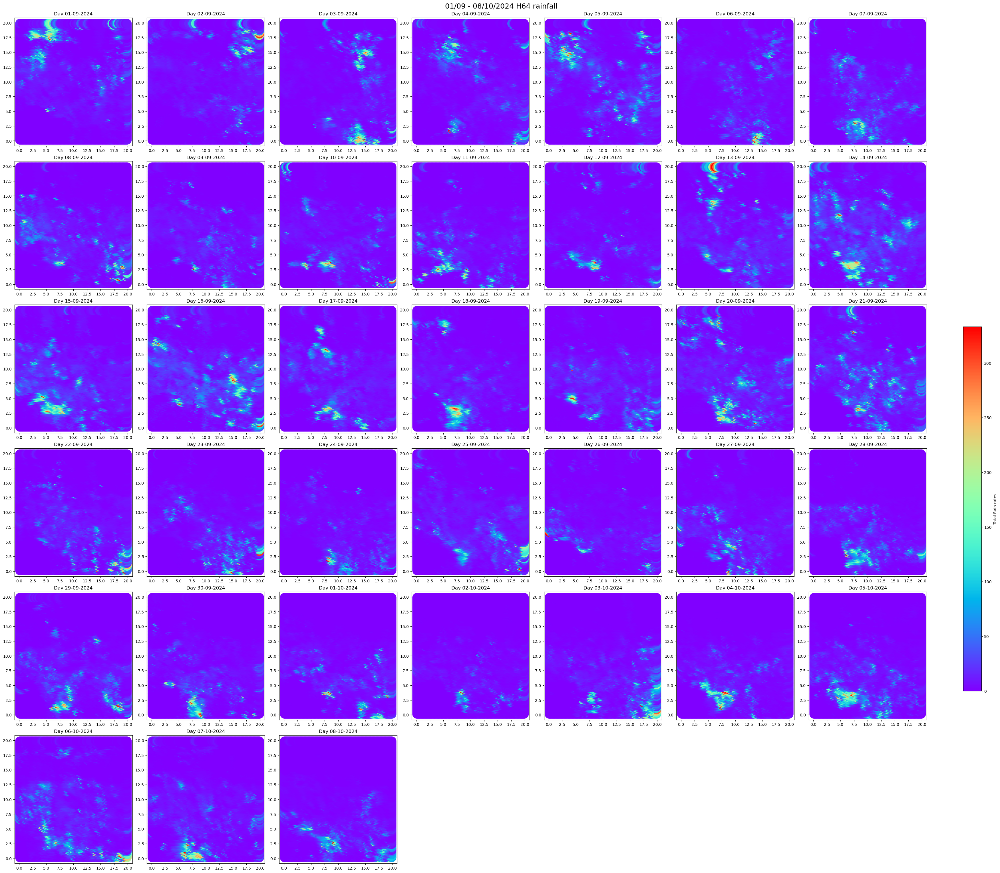

In [9]:
# Create an array for all the rain rates over the period
Rain_rates = []
time_coords = []
temp_files = []
# Initialise the figure
plt.ioff()
fig, axes = plt.subplots(plt_dim, plt_dim, figsize=(plt_dim * 5, 5 * plt_dim), constrained_layout=True)
if len(filelist) > 1:
    axes = axes.flatten()
if datestart > dateend:
    print("Warning: Start date is after the end date. Please check your input dates.")
else:
    if datestart.month != dateend.month:
        # Different months
        title_start = datestart.date().strftime("%d/%m")
    else:
        # Same month, different days
        title_start = datestart.date().strftime("%d")
    title_end = dateend.date().strftime("%d/%m/%Y")
    title = f"{title_start} - {title_end} H64 rainfall" if datestart != dateend else f"{datestart.date()} H64 rainfall"
    fig.suptitle(title, fontsize=18)
    
for i, file in enumerate(filelist):
    print(f'Reading file {file}')
    
    # Open the dataset with xarray
    with xr.open_dataset(os.path.join(data_path, file), chunks={'x': 1000, 'y': 1000}, engine='netcdf4') as ds:
        end_of_accumulation_time = ds.attrs.get('end_of_accumulation_time')
        if end_of_accumulation_time:
            time_coords = pd.to_datetime(end_of_accumulation_time, format = '%Y%m%dT%H:%MZ')
            time_coord = time_coords.strftime('%d-%m-%Y')
        else:
            raise ValueError(f"'end_of_accumulation_time' attribute missing in file: {file}")

    # Assign lat, lon and time as coordinates to the dataset
    ds = ds.assign_coords({
            'latitude': ('latitude', ds.lat.values[:]),
            'longitude': ('longitude', ds.lon.values[:]),
            'time': time_coords
            })    
    ds = ds.drop_vars(['lon', 'lat'])
    
    # Convert the dataset to dataframe for spatial analysis
    dataframe_from_dataset = ds.to_dataframe().reset_index()
    
    data_gdf = gpd.GeoDataFrame(
            dataframe_from_dataset, 
            geometry=gpd.points_from_xy(dataframe_from_dataset.longitude, 
                                        dataframe_from_dataset.latitude), 
            crs="EPSG:4326"
          )
    
    
    # Perform an inner spatial join for points in the dataset that fall in the AOI and keep the columns of the data
    point_in_shp = gpd.sjoin(data_gdf, aoi_gdf, how='inner')
    point_in_shp = point_in_shp[dataframe_from_dataset.columns]
    
    if len(filelist) > 1:
        im =axes[i].scatter(point_in_shp['longitude'], 
                            point_in_shp['latitude'], 
                            c=point_in_shp['acc_rr'], 
                            cmap='rainbow',
                            vmin = point_in_shp['acc_rr'].min(),
                            vmax = point_in_shp['acc_rr'].max(),
                            s=500
                            )
        axes[i].set_title(f'Day {time_coord}')

        # Add shapefile to the plot
        if aoi_tab.selected_index==1:
            if i < len(filelist):
                aoi_gdf.boundary.plot(ax=axes[i], edgecolor='black', linewidth=0.2)
            else:
                axes[i].set_visible(False)

        
    else:
        im =axes.scatter(point_in_shp['longitude'], 
                            point_in_shp['latitude'], 
                            c=point_in_shp['acc_rr'], 
                            cmap='rainbow',
                            vmin = point_in_shp['acc_rr'].min(),
                            vmax = point_in_shp['acc_rr'].max(),
                            s=500
                            )
        # Add shapefile to the plot
        if aoi_tab.selected_index==1:
            aoi_gdf.boundary.plot(ax=axes[i], edgecolor='black', linewidth=0.2)
            
    point_in_shp.set_index(['time', 'latitude', 'longitude'], inplace=True)
    
    # Convert the dataframe to xarray dataset
    dsplot = point_in_shp.to_xarray()
    # dsplot['time'] = pd.to_datetime(dsplot['time'].values)
  
    temp_files.append(dsplot)
    print(f'Done reading file {file}')

# Delete those axes that have no plot on them
if len(filelist) > 1:
    for ax in axes.flatten():
        if not ax.has_data():
            fig.delaxes(ax)

plt.ioff()
cbar = fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.02, pad=0.04)
cbar.set_label('Total Rain rates')
                        
# Save the figure
plt.savefig('output/H64_Daily_Rainfall_plot.png', dpi=300)

## Results Visualization

### Rainfall Distribution Map

The following section illustrates the spatial distribution of H64 rain rate estimate over the study area for the selected period. Each point on the map represents a rainfall measurement, with color intensity indicating the rainfall intensity in millimeters per day (mm/day). The map provides insights into the spatial variability of rainfall across different regions and highlights areas with significant precipitation over the period.

#### Daily plots

In [10]:
fig

#### Total rainfall over the period

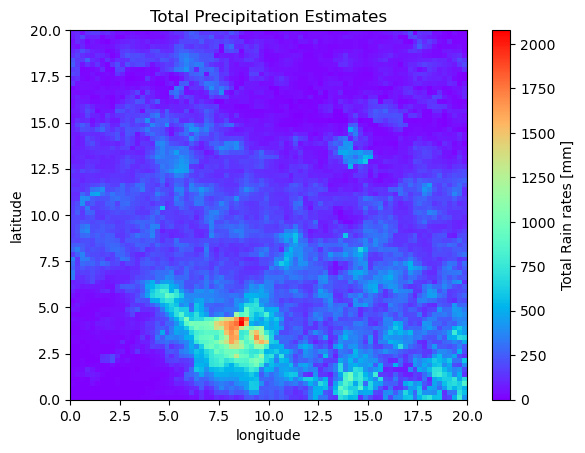

In [12]:
# Plot of the total rainfall
combined_ds = xr.concat(temp_files, dim='time')

total_rr = combined_ds.sum(dim='time', skipna=False)
plt.close()
tt = total_rr['acc_rr'].plot(
                x = 'longitude',
                y = 'latitude',
                cmap="rainbow",
                cbar_kwargs={"label": "Total Rain rates [mm]", "pad": 0.05},
                vmin = total_rr['acc_rr'].min(),
                vmax = total_rr['acc_rr'].max()  
            )
plt.title('Total Precipitation Estimates', fontsize=12)
plt.savefig('H64_Total_Rainfall.png', dpi=300)
plt.show()

## Data Analysis/Evaluation

After visualizing the H64 rainfall data, we can perform several analyses to gain insights into the precipitation patterns and characteristics. Some of the key analyses include:

### Temporal Analysis
   - Analyze the temporal distribution of rainfall over the selected period.
   - Identify trends, seasonal variations, and any notable anomalies in the rainfall patterns.

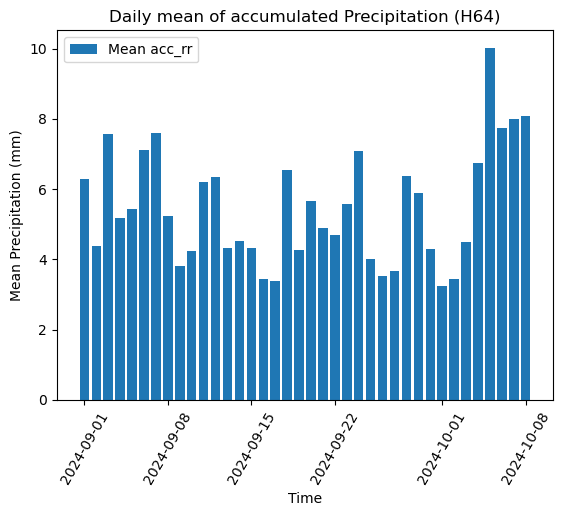

In [18]:
acc_rr_mean = combined_ds['acc_rr'].mean(dim=['longitude', 'latitude'])
time_index = pd.to_datetime(combined_ds['time'].values)
plt.bar(time_index, acc_rr_mean.values, label='Mean acc_rr')
plt.xticks(rotation=60)
plt.title('Daily mean of accumulated Precipitation (H64)')
plt.xlabel('Time')
plt.ylabel('Mean Precipitation (mm)')
plt.legend()
plt.savefig('H64 daily mean of accumulated precipitation')
plt.show()

### Frequency Analysis
The objective of this section is to show the frequency of rain rates in 10 classed intervals within the dataset over the period. The number of intervals could be changed in the 'num_bins' variable.

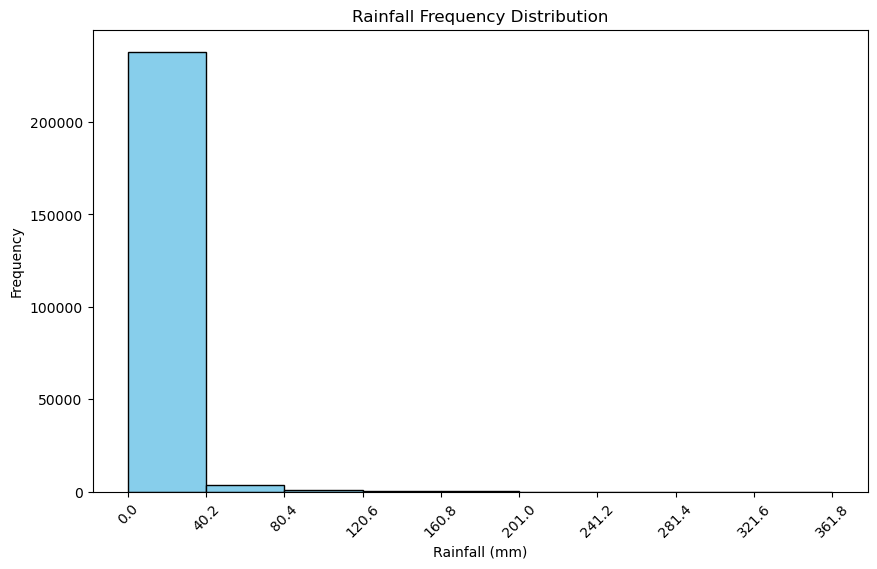

In [19]:
# Calculate rainfall frequency distributions to understand the occurrence of different rainfall intensities.
# Flatten the accumulated rainfall data for analysis
rainfall_data_flat = combined_ds['acc_rr'].values.flatten()

rainfall_min = np.min(rainfall_data_flat)
rainfall_max = np.max(rainfall_data_flat)
num_bins = 10  # can be changed based on the need
bins = np.linspace(rainfall_min, rainfall_max, num_bins)

# Calculate the frequency distribution by binning the data
rainfall_freq, bin_edges = np.histogram(rainfall_data_flat, bins=bins)

# Plot the Rainfall Frequency Distribution
plt.figure(figsize=(10, 6))
plt.bar(bin_edges[:-1], rainfall_freq, width=np.diff(bin_edges), edgecolor="black", align="edge", color='skyblue')
plt.title('Rainfall Frequency Distribution')
plt.xlabel('Rainfall (mm)')
plt.ylabel('Frequency')
plt.xticks(bin_edges, rotation=45)

# Save the frequency analysis plot
plt.savefig('H64_Dynamic_Rainfall_Frequency_Distribution_Counts.png', dpi=300)
plt.show()



### Statistical Analysis
   - Perform statistical analyses such as mean, median, standard deviation, and skewness to characterize the rainfall data.
   - Assess the variability and reliability of the rainfall measurements.

In [20]:
# Flatten the accumulated rainfall data for analysis
rainfall_data_flat = combined_ds['acc_rr'].values.flatten()

mean_rainfall = np.mean(rainfall_data_flat)
median_rainfall = np.median(rainfall_data_flat)
std_dev_rainfall = np.std(rainfall_data_flat, ddof=1)  # Sample standard deviation
skewness_rainfall = skew(rainfall_data_flat)

print(f"Mean Rainfall:                  {mean_rainfall:.2f} mm")
print(f"Median Rainfall:                {median_rainfall:.2f} mm")
print(f"Standard Deviation of Rainfall: {std_dev_rainfall:.2f} mm")
print(f"Skewness of Rainfall:           {skewness_rainfall:.2f}")

Mean Rainfall:                  5.46 mm
Median Rainfall:                2.08 mm
Standard Deviation of Rainfall: 12.74 mm
Skewness of Rainfall:           7.25


## Save
After processing and analyzing the rainfall data, it's essential to save the data for future use. In this section, we save the processed rainfall data into a NetCDF4 file format, which provides a standardized and efficient way to store multidimensional scientific data. Note that the resulting file will contain data for only the specified AOI.

In [21]:
combined_ds.to_netcdf(path='H64_daily_accumulated_rates.nc', format='NETCDF4', engine='netcdf4')

Also save the data in CSV format for interested users.

In [22]:
# Convert the netCDF4 file to CSV
combined_df = combined_ds.to_dataframe()
combined_df.to_csv('output/output.csv')


## Conclusion
In conclusion, this notebook provides a detailed exploration of the H64 product, focusing on rainfall data analysis. We began by acquiring and preprocessing the H64 data, showcasing efficient methods for downloading, extracting, and cleaning the data. The subsequent visualization section illustrated various plots, specifically tailored to the H64 rainfall dataset, offering valuable insights into precipitation patterns.

While this analysis primarily focuses on the H64 product, the methodologies and techniques presented here can be applied to other datasets and domains with minor modifications.

## References
Provide list of all reference materials necessary for understanding the topic at hand as well as those used to write the document.

<div style="text-align: right;">
    <a href="#Table-of-Contents">Jump to TOC</a>
</div>

### Appendix 1
Below is a display of the H64 product user manual.